In [1]:
import pandas as pd
import json
import re
import tifffile as tiff
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from PIL import Image
from tqdm import tqdm

from sklearn.linear_model import LinearRegression

In [2]:
with tiff.TiffFile('4-2.tif') as tif:
    frames = tif.asarray()

f = []

for i in tqdm(range(len(frames))):
    f.append(frames[i][:, :, 0])

100%|██████████| 100/100 [00:00<00:00, 100174.44it/s]


In [3]:
import matplotlib.animation as mat_anim
from IPython.display import HTML

def draw_frames(frames, bgs_frames):
    if len(frames) != len(bgs_frames):
        raise Exception("The number of frames on each array doesn't match.")
    fig, axs = plt.subplots(1, 2, figsize=(12,4))
    plt.tight_layout()

    def update(frame):
        plt.suptitle(f"Frame {frame}")
        axs[0].clear() 
        axs[1].clear()  
        axs[0].set_title("Original")
        axs[0].imshow(frames[frame], cmap='gray')  
        axs[1].set_title("BGS")
        axs[1].imshow(bgs_frames[frame], cmap='gray') 
        return axs

    return mat_anim.FuncAnimation(fig=fig, func=update, frames=len(frames), interval=500)

### Background init


> model of the background

In [4]:
def initialBackgroundv2(frame: np.array, thresh1:float = 2., nbLine:int = 5)->np.array:
    """ 
    Creates the model of the background

    Args:
    -----
    - `frame`: the one frame we want to create the background from
    - `thresh1`: value of the threshold on the heuristic for the detection
                 of black bands
    - `nbLine`: number of randomly selected lines for the linear model

    Output:
    -------
    The background of the image
    """
    
    L = frame.shape[0] // 2     # take the mid of the height
    
    ## detect big lines and zone above or below black bands
    #  (will simply set them as the background --> big assumption here)

    # since the black bands are horizontal, performing a sum over the width
    # should give some values that are significantly smaller than the rest 
    # then, we just have to detect those important low values

    test = np.sum(frame, axis = 1)          
    thresh = np.min(test) * thresh1
    ids = np.where(test < thresh)[0]        # y ids of the lines

    idMin = ids[ids < L]
    idMax = ids[ids > L]
    maxIdMin = np.max(idMin)
    minIdMax = np.min(idMax)

    idMin = np.arange(maxIdMin+1)
    idMax = np.arange(minIdMax, frame.shape[0])

    ## tackle the middle part
    ## model the horizontal color shift
    linearIdsList = np.random.randint(0, frame.shape[0], nbLine)

    y = None

    for i in range(len(linearIdsList)):
        if linearIdsList[i] in idMin or linearIdsList[i] in idMax:
            if linearIdsList[i] < L:
                linearIdsList[i] += np.random.randint(40, L)    #just to get it off the black bands zone
            else:
                linearIdsList[i] -= np.random.randint(40, L)    # just to get it off the black bands zone
        
        if y is None:
            y = frame[i, :].reshape(1, -1)
        else:
            y = np.vstack((y, frame[i, :]))

    X = np.tile(np.arange(frame.shape[1])[np.newaxis, :], (len(linearIdsList), 1))


    model = LinearRegression().fit(X.reshape(-1, 1), y.reshape(-1, 1))
    preds = model.predict(np.arange(frame.shape[1]).reshape(-1,1)).reshape(1,-1)
    bg = np.tile(preds, (frame.shape[0], 1))
    
    # replace the two black bands zones with the values from the frame

    bg[idMin, :] = frame[idMin, :]
    bg[idMax, :] = frame[idMax, :]
    bg = bg.astype(int)

    return bg


In [27]:
def medianInit(frames:np.array)->np.array:
    """ 
    Function to initialize the background from the first frames

    Args:
    -----
    - `frames`: starting frames
    """
    bg = None

    for f in frames:
        if bg is None:
            bg = f.reshape(1, *f.shape)

        else:
            bg = np.vstack((bg, f.reshape(1, *f.shape)))

    return np.median(bg, axis=0).astype(int)

In [40]:
class background_sub():
    def __init__(self, frames, params):
        self.frames = frames

        self.alpha = params[0]                  # exponential filter

        self.threshold = params[1]              # threshold comparison

        self.nbIinit = params[2]                # number of frames to wait for the bg init

        self.initFrameId = params[2]-1           # id of the first frame

        self.methodUpdate = params[3]           # 0  if alpha is constnat, 1 for decreasing alpha

        self.nbFrames = 0                       # number of frames for the decreasing alpha

        self.binMaps = []                       # list of binary maps

        self.initVersion = params[4]            # 0: model, 1: median
        
    def _initBg(self, frames: list)->np.array:
        """ 
        Initialization of the algorithm

        Args:
        -----
        - `frames`: list of frames from which the init background is obtained
        """
        
        if self.initVersion == 0:
            bg = initialBackgroundv2(frames[0])     
        elif self.initVersion == 1:
            bg = medianInit(frames[:self.nbIinit])

        return bg

    def _updateBg(self, prevBg:np.array, frame:np.array, alpha:float, bMap:np.array)->np.array:
        """ 
        Function to perform the update

        Args:
        -----
        -`prevBg`: previous background
        - `frame`: current frame
        - `alpha`: learning rate
        - `bMap`: binary map from background subtraction (not used)
        """
        return ((1-alpha) * prevBg + alpha * frame)

    
    def _compareFrames(self, frame:np.array, bg:np.array, threshold:float)->np.array:
        """  
        Function to compare the background and the foreground

        Args:
        -----
        - `frame`: foreground
        - `bg`: background
        - `threshold`: threshold in the comparison

        Returns:
        --------
        The binary map
        """

        d = np.abs(bg - frame)

        bMap = (d >= threshold)
        return bMap


    def _loop(self):
        """ 
        Main function to apply the background subtraction algorithm
        """

        ## initialize the background
        bg = self._initBg(self.frames)

        for i in range(self.initFrameId, len(self.frames)):

            ## compare background and foreground
            bMap = self._compareFrames(self.frames[i], bg, self.threshold)
            
            self.binMaps.append(bMap)

            ## get the current alpha
            if self.methodUpdate:
                alpha = self.alpha / (self.nbFrames+1)
                self.nbFrames += 1
            else:
                alpha = self.alpha

            # update the background
            bg = self._updateBg(bg, self.frames[i], self.alpha, bMap)

            bg = bg.astype(int)
        return self.binMaps
    


In [41]:
bgS = background_sub(f, [0.10, 60, 1, 1, 0])

In [42]:
bMap = bgS._loop()

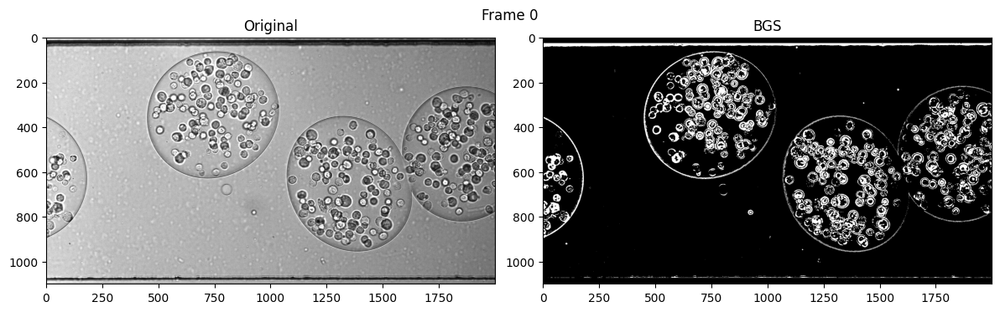

In [43]:
animation = draw_frames(frames, bMap)
HTML(animation.to_html5_video())

In [44]:
bgS2 = background_sub(f, [0.10, 60, 6, 1, 1])

In [45]:
bMap = bgS2._loop()

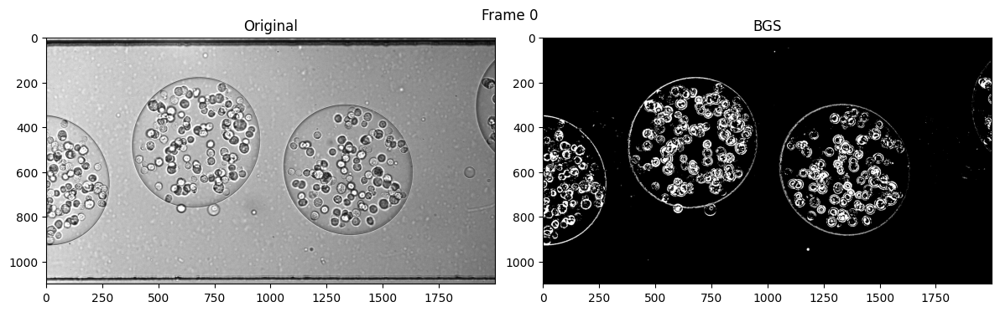

In [47]:
animation = draw_frames(frames[5:], bMap)
HTML(animation.to_html5_video())